# Jan 26, 2026: collect ROI time series

conda env: gt

In [1]:
# os.system(f'mount_aba_paper2')
# os.system(f'unmount_aba_paper2')

In [2]:
import os
import sys
import numpy as np 
import pandas as pd 
from glob import glob
from os.path import join, basename
import dill as pickle
import seaborn as sns
from tqdm import tqdm
from joblib import Parallel, delayed

In [3]:
class ARGS(): pass

args = ARGS()

args.SEED = 100
np.random.seed(args.SEED)

In [4]:
PROJ_path = f'/home/govindas/lab-data/aba'
ATLAS_path = f'{PROJ_path}/../ROI_mask'
atlas_name = f'NEWMAX_ROIs_final_gm_100_2mm' #f'NEWMAX_ROIs_final_gm_104_2mm' #f'ESC2_ROIs_final_gm_69' #f'NEWMAX_ROIs_final_gm_104_2mm' #f'ABA_ROIs_final_gm_36'
atlas_file = f'{ATLAS_path}/{atlas_name}.nii.gz'

if atlas_name in [f'NEWMAX_ROIs_final_gm_104_2mm', f'NEWMAX_ROIs_final_gm_100_2mm']:
    suffix = '_Info'
elif atlas_name == f'ESC2_ROIs_final_gm_69':
    suffix = ''
roi_info = pd.read_csv(f'{ATLAS_path}/{atlas_name}{suffix}.txt', sep='\t') 

DATA_path = f'{PROJ_path}/{atlas_name}/cleaned_timeseries'
# copied `cleaned_timeseries` 
# from joyneelm@kaba.umd.edu:~/slds_on_aba/cleaned_timeseries_max104 
# by running preproc_get_roitimeseries.sh

In [5]:
roi_info

,ROI_name,Index,num_voxels
0,R_med._OFC,1,407
1,L_med._OFC,2,339
2,R_lat._OFC,3,56
3,L_lat._OFC,4,62
4,M_vmPFC1,5,67
...,...,...,...
95,Hypothalamus_PH,99,10
96,dlPAG,101,11
97,dmPAG,102,13
98,lPAG,103,13


In [6]:
REG_path = f'/home/govindas/mounts/kaba/aba_paper2/stimtimes_ABApaper2'

In [7]:
ts_files = sorted(glob(f'{DATA_path}/*', recursive=True))
print(f'{len(ts_files)} subjects in the dataset')

72 subjects in the dataset


In [8]:
cond_cols = ['play_highR','play_highT','play_lowR','play_lowT',
             'feedback_NotRec_highR','feedback_NotRec_highT','feedback_NotRec_lowT','feedback_NotRec_lowR',
             'feedback_Rec_highR','feedback_Rec_highT','feedback_Rec_lowT','feedback_Rec_lowR',]

In [9]:
num_trs_per_run = 410

In [10]:
def to_TR(t):
    return int(round(float(t)/1.25))

def zscore(ts):
    ts = ts - np.mean(ts,axis=0)
    ts = ts / np.std(ts,axis=0)
    return ts

In [11]:
df_cols = ['pid', 'rid', 'timeseries', 'input_ts']
df_cols += cond_cols
df_data = {col:[] for col in df_cols}

for ts_file in ts_files:
    ts_filename = basename(ts_file)
    pid = ts_filename.split('_')[0]
    
    ts_allruns = np.loadtxt(ts_file) # num_rois x num_timeall
    num_rois, num_runs = ts_allruns.shape[0], ts_allruns.shape[1] // num_trs_per_run
    if num_runs * num_trs_per_run != ts_allruns.shape[1]: 
        print(f"{pid} is faulty")
        continue
    ts_allruns = np.split(ts_allruns, num_runs, axis=1)
    
    for rid in range(num_runs):
        
        ts = ts_allruns[rid].T # num_time x num_rois
        ts = zscore(ts)
        
        input_ts = []
        for col in cond_cols:
            
            if "play" in col:
                dur = 8
            else:
                dur = 1
            
            cond_reg_file = join(REG_path, pid, "regs", f"{pid}_{col}.txt")
            with open(cond_reg_file, 'r') as f:
                reg = np.zeros(num_trs_per_run)
                times = [to_TR(i.strip()) for i in f.readlines()[rid].split('\t') if '*' not in i]
                df_data[col].append(times)
                for t in times:
                    if dur>1:
                        reg[t-dur:t+1] = 1
                    elif dur==1:
                        reg[t] = 1
                    input_ts.append(reg)
        input_ts = np.stack(input_ts).T
            
        df_data['pid'].append(pid)
        df_data['rid'].append(rid)
        df_data['timeseries'].append(ts)
        df_data['input_ts'].append(input_ts)

df = pd.DataFrame(df_data)

ABA600 is faulty
ABA601 is faulty


In [12]:
df

,pid,rid,timeseries,input_ts,play_highR,play_highT,play_lowR,play_lowT,feedback_NotRec_highR,feedback_NotRec_highT,feedback_NotRec_lowT,feedback_NotRec_lowR,feedback_Rec_highR,feedback_Rec_highT,feedback_Rec_lowT,feedback_Rec_lowR
0,ABA602,0,"[[-0.5363049761065091, -0.5235810475725641, -0...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[32, 132, 232, 256]","[171, 195, 213, 320]","[72, 112, 275, 297]","[13, 52, 90, 152]",[237],[],"[16, 55, 95, 155]",[75],"[37, 136, 259]","[176, 198, 217, 325]",[],"[117, 279, 302]"
1,ABA602,1,"[[-1.073854295137049, 0.16644773932792917, 0.7...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[13, 136, 178, 222]","[32, 93, 244, 324]","[53, 71, 113, 265]","[158, 199, 286, 305]",[183],"[96, 247, 327]","[288, 307]","[56, 76, 117]","[15, 138, 227]",[36],"[160, 203]",[268]
2,ABA602,2,"[[-0.5426393364164204, 1.1117823296380391, -2....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[116, 179, 198, 237]","[56, 218, 258, 280]","[32, 138, 160, 301]","[13, 75, 94, 324]","[201, 240]","[59, 221, 263, 284]","[16, 78, 98, 326]",[141],"[121, 182]",[],[],"[36, 164, 304]"
3,ABA602,3,"[[0.6581804630186637, 0.5689399303717901, -0.0...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[76, 145, 207, 290]","[13, 32, 53, 330]","[185, 232, 250, 309]","[101, 125, 166, 272]",[211],"[16, 35, 57, 334]","[105, 130, 170, 275]",[234],"[81, 148, 293]",[],[],"[191, 254, 313]"
4,ABA602,4,"[[-1.0309466471716902, -0.4484531410982982, 0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[57, 147, 192, 316]","[79, 102, 126, 255]","[35, 170, 233, 335]","[13, 213, 276, 295]",[],"[83, 107, 130, 258]","[16, 279, 298]",[338],"[62, 151, 195, 319]",[],[217],"[38, 175, 237]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
551,ABA698,3,"[[1.5679352395494497, 1.1477153071025095, 0.62...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[12, 56, 229, 334]","[159, 181, 272, 293]","[77, 98, 139, 312]","[37, 119, 204, 251]",[338],[296],"[40, 122, 209, 255]","[101, 314]","[17, 60, 232]","[162, 184, 277]",[],"[80, 143]"
552,ABA698,4,"[[1.0093643195398334, 1.1486374612751429, 0.08...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[12, 34, 54, 261]","[74, 96, 305, 323]","[139, 159, 201, 241]","[120, 178, 221, 284]",[264],[],"[225, 287]","[162, 204]","[17, 37, 58]","[78, 100, 308, 326]","[123, 181]","[142, 245]"
553,ABA698,5,"[[-0.5914301705905718, -0.13375187043392217, -...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[55, 163, 268, 328]","[33, 78, 207, 249]","[121, 186, 290, 309]","[13, 101, 143, 228]",[],"[83, 212]","[16, 104, 148, 232]","[293, 313]","[60, 167, 272, 330]","[38, 252]",[],"[126, 189]"
554,ABA698,6,"[[-0.4389900031048448, 1.164641507848508, -0.1...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[30, 107, 253, 274]","[50, 87, 210, 318]","[148, 169, 190, 234]","[13, 68, 126, 296]",[255],"[52, 216]","[16, 71, 300]",[236],"[33, 110, 279]","[90, 322]",[130],"[152, 171, 194]"


---
get condition wise time series per subject

In [13]:
play_conds = [col for col in cond_cols if 'play' in col]
play_conds

['play_highR', 'play_highT', 'play_lowR', 'play_lowT']

In [14]:
df[play_conds].map(lambda x: len(x)).sum().sum() # num_trials

np.int64(8844)

In [15]:
df_ts = []

for idx_row, row in df.iterrows():
    r = pd.DataFrame(dict(
        sub=[row['pid']],
        run=[row['rid']],
    ))
    for cond in play_conds:
        play_ends = row[cond]
        trial_windows = [
            list(range(play_end-8, play_end+4+1))
            for play_end in play_ends
        ]
        
        ts = row['timeseries']
        trial_ts = [
            ts[trial_window, :]
            for trial_window in trial_windows
        ]
        trial_ts = np.stack(trial_ts)

        r[cond] = [trial_ts]
    
    df_ts.append(r)
    
df_ts = pd.concat(df_ts).reset_index(drop=True)
df_ts

,sub,run,play_highR,play_highT,play_lowR,play_lowT
0,ABA602,0,"[[[0.772962768005994, 0.027128934891122423, 0....","[[[-0.22216339232870685, -0.8715079098898862, ...","[[[-1.1985321709328278, 0.041593399590052475, ...","[[[-0.6169540222793665, -0.584467025376894, 0...."
1,ABA602,1,"[[[1.1173576693259635, -0.2217349101987449, -0...","[[[-0.19174514160697773, -0.9168454800565413, ...","[[[0.9844849130226946, -1.1735009016608238, 0....","[[[-0.18210486246262952, 0.4615230025295883, -..."
2,ABA602,2,"[[[0.7224823005491996, -1.232327703964998, -1....","[[[0.5143397802567918, 0.618786984916922, 0.59...","[[[-0.27410037279459076, 1.7791556151943184, 0...","[[[-0.17605798691418004, -1.6670195788136595, ..."
3,ABA602,3,"[[[0.6060753756080832, 0.030511490935999017, 1...","[[[0.5118322605892102, -0.5687441156299206, 0....","[[[2.0073727011988827, 0.8519876481499351, -0....","[[[1.7259845947417558, -0.2617681132978361, 0...."
4,ABA602,4,"[[[0.7048385378742246, 1.170696939016591, -0.0...","[[[0.07378615655297532, 0.16645096988440666, -...","[[[-2.0634615522278827, 0.4515583534688838, -0...","[[[-1.3673473297442815, -1.938318666035096, -0..."
...,...,...,...,...,...,...
551,ABA698,3,"[[[1.9175054354527417, 1.6791657771806088, -0....","[[[1.0256932401251329, 1.3491476826325373, -1....","[[[0.786889509044422, 0.42677399604852617, 0.8...","[[[-0.752089264423914, 0.17886576126547857, -0..."
552,ABA698,4,"[[[-0.12859276435366637, -0.449248882560284, 0...","[[[0.918491914056718, 1.0005948080863685, -1.6...","[[[0.15984301986820365, 0.896461123764391, 0.7...","[[[1.088403393808012, 0.4620084527880611, -0.0..."
553,ABA698,5,"[[[1.1564697271695907, 1.7968656758357011, -1....","[[[-0.2176409725844696, -0.18274899067333014, ...","[[[1.7264885696308547, 0.5610064082907323, -1....","[[[-0.09215275016581848, 1.154275645686303, -1..."
554,ABA698,6,"[[[0.7674825916508768, -0.45682488600785814, 0...","[[[0.3325173317030818, -1.8246649669575834, -1...","[[[0.6672593665267801, -0.8989456612365428, 0....","[[[-0.1429292054785982, 0.28019817115044415, -..."


In [16]:
file = f'{PROJ_path}/{atlas_name}/roi_timeseries_df.pkl'
with open(file, 'wb') as f:
    pickle.dump(df_ts, f)

In [17]:
df_sub_ts = []
for (sub,), sub_group in df_ts.groupby(by=['sub']):
    row = pd.DataFrame(dict(
        sub=[sub],
    ))
    for cond in play_conds:
        row[cond] = [np.mean(np.vstack(sub_group[cond].to_list()), axis=0)]
    
    df_sub_ts.append(row)
df_sub_ts = pd.concat(df_sub_ts).reset_index(drop=True)

---
plot roi timeseries and verify

In [18]:
# plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.cm import rainbow
from cycler import cycler

plt.rcParamsDefault['font.family'] = "sans-serif"
plt.rcParamsDefault['font.sans-serif'] = "Arial"
plt.rcParams['font.size'] = 14
plt.rcParams["errorbar.capsize"] = 0.5

import colorcet as cc

# ignore user warnings
import warnings
warnings.filterwarnings("ignore") #, category=UserWarning)

In [19]:
def get_colorblind_palette(n=20):
    """Return a merged, deduplicated colorblind-safe palette from CUD, Seaborn, and extended sources."""
    base = [
        "#0072B2", "#D55E00", "#009E73", "#CC79A7",
        "#F0E442", "#56B4E9", "#E69F00", "#000000",
        "#999999", "#882255", "#44AA99", "#117733"
    ]
    
    new = [
        "#0173B2", "#DE8F05", "#029E73", "#D55E00",  # D55E00 already in base
        "#CC78BC", "#CA9161", "#FBAFE4", "#949494",
        "#ECE133", "#56B4E9"  # 56B4E9 already in base
    ]
    
    # Deduplicate while preserving order
    seen = set()
    full = base + new
    merged = []
    for color in full:
        if color.lower() not in seen:
            merged.append(color)
            seen.add(color.lower())
    
    return merged[:n]

def setup_mpl(fontsize=7):
    """Configure matplotlib for Illustrator export with Helvetica-style fonts and clean styles."""
    
    CUD_COLORS = get_colorblind_palette()
    
    mpl.rcParams.update({
        # Fonts and layout
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial", "DejaVu Sans"],
        "font.size": fontsize,
        "axes.titlesize": fontsize,
        "axes.labelsize": fontsize,
        "xtick.labelsize": fontsize,
        "ytick.labelsize": fontsize,
        "legend.fontsize": fontsize,

        # Export settings
        "svg.fonttype": 'none',
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
        "figure.dpi": 300,
        "savefig.dpi": 300,
        "text.usetex": False,

        # Axes and ticks
        "axes.linewidth": 0.5,
        "xtick.major.width": 0.5,
        "ytick.major.width": 0.5,
        "xtick.minor.width": 0.5,
        "ytick.minor.width": 0.5,
        "xtick.major.size": 2.5,
        "ytick.major.size": 2.5,

        # Lines
        "lines.linewidth": 1.0,

        # Default color cycle (Color Universal Design)
        "axes.prop_cycle": cycler('color', CUD_COLORS),
    })

    # mpl.rcParams["axes.prop_cycle"] = cycler('color', get_colorblind_palette())

In [20]:
setup_mpl(fontsize=12)
CUD_COLORS = get_colorblind_palette()

In [21]:
import seaborn as sns

In [22]:
cond_colors = {
    'play_highT': CUD_COLORS[0], #'red',
    'play_lowT': CUD_COLORS[1], #'orange',
    'play_highR': CUD_COLORS[2], #'green',
    'play_lowR': CUD_COLORS[3], #'blue',
}

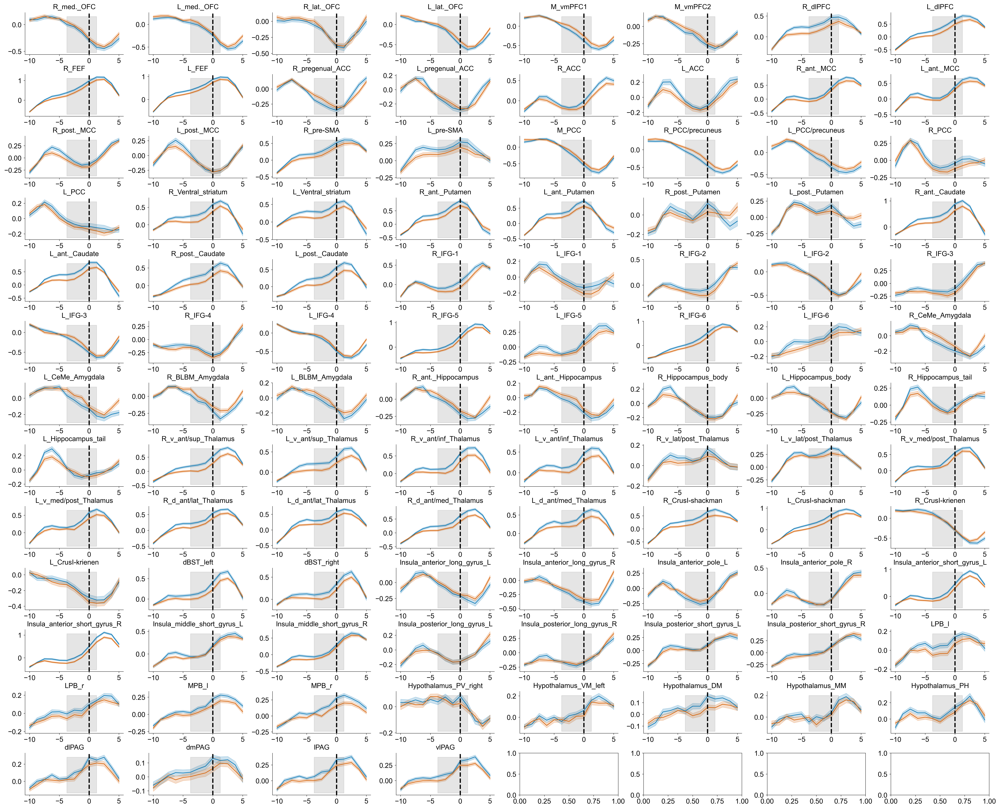

In [23]:
# THREAT
ncols = 8
nrows = np.ceil(num_rois / ncols).astype(int)

fig, axs = plt.subplots(nrows, ncols, figsize=(3*ncols, 1.5*nrows))
fig.tight_layout()

for roi_idx in range(num_rois):
    r, c = roi_idx // ncols, roi_idx % ncols
    ax = axs[r, c] if nrows > 1 else axs[c]
    
    ax.set(title=f'{roi_info.at[roi_idx, "ROI_name"]}')
    
    for cond in play_conds:
        if 'R' in cond: continue
        Xs = df_sub_ts[cond].to_list()
        meants = np.mean(Xs, axis=0)
        meants = meants[:, roi_idx]
        stets = np.std(Xs, axis=0) / np.sqrt(len(Xs))
        stets = stets[:, roi_idx]
        
        x = np.arange(-10, 5+1.25, 1.25)
        ax.plot(x, meants, c=cond_colors[cond])
        ax.fill_between(
            x, 
            meants-stets, 
            meants+stets,
            alpha=0.2,
            color=cond_colors[cond],
        )
        ax.axvline(x[8],linewidth=2,linestyle='--',color='black')
        
    ymin, ymax = ax.get_ylim()
    y = np.arange(ymin, ymax, (ymax-ymin)/10)
    ax.fill_betweenx(
        y, 
        x[5], 
        x[9],
        color='grey',
        alpha=0.2,
    )
    sns.despine(ax=ax)

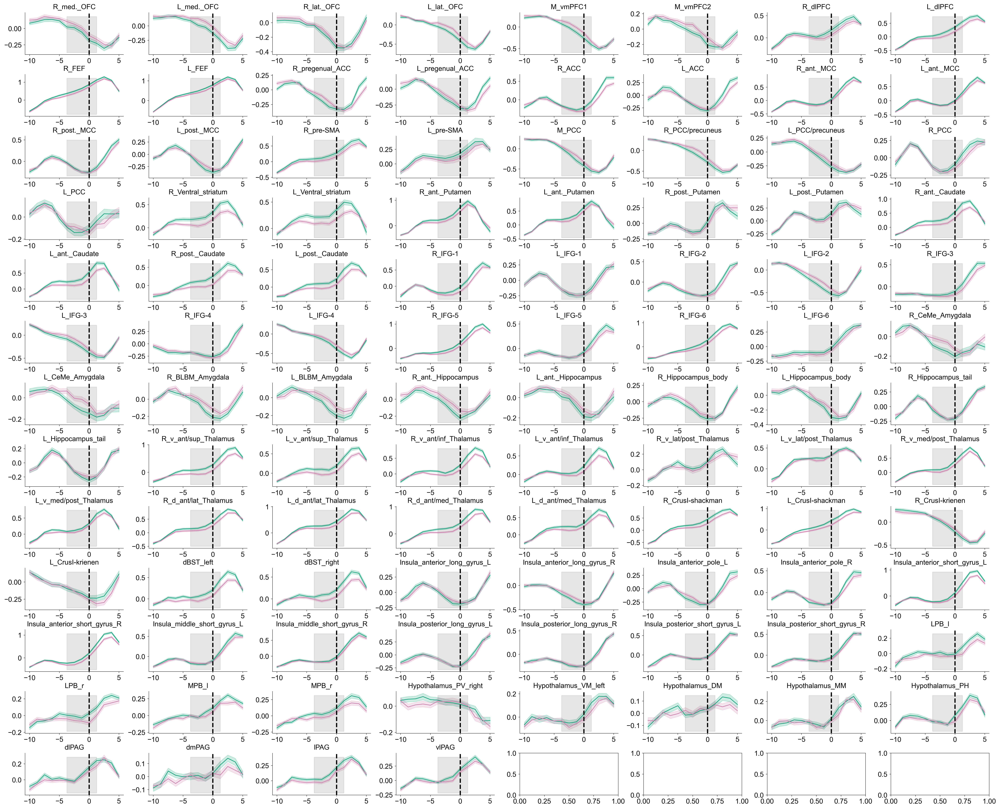

In [24]:
# REWARD
ncols = 8
nrows = np.ceil(num_rois / ncols).astype(int)

fig, axs = plt.subplots(nrows, ncols, figsize=(3*ncols, 1.5*nrows))
fig.tight_layout()

for roi_idx in range(num_rois):
    r, c = roi_idx // ncols, roi_idx % ncols
    ax = axs[r, c] if nrows > 1 else axs[c]
    
    ax.set(title=f'{roi_info.at[roi_idx, "ROI_name"]}')
    
    for cond in play_conds:
        if 'T' in cond: continue
        Xs = df_sub_ts[cond].to_list()
        meants = np.mean(Xs, axis=0)
        meants = meants[:, roi_idx]
        stets = np.std(Xs, axis=0) / np.sqrt(len(Xs))
        stets = stets[:, roi_idx]
        
        x = np.arange(-10, 5+1.25, 1.25)
        ax.plot(x, meants, c=cond_colors[cond])
        ax.fill_between(
            x, 
            meants-stets, 
            meants+stets,
            alpha=0.2,
            color=cond_colors[cond],
        )
        ax.axvline(x[8],linewidth=2,linestyle='--',color='black')
        
    ymin, ymax = ax.get_ylim()
    y = np.arange(ymin, ymax, (ymax-ymin)/10)
    ax.fill_betweenx(
        y, 
        x[5], 
        x[9],
        color='grey',
        alpha=0.2,
    )
    sns.despine(ax=ax)